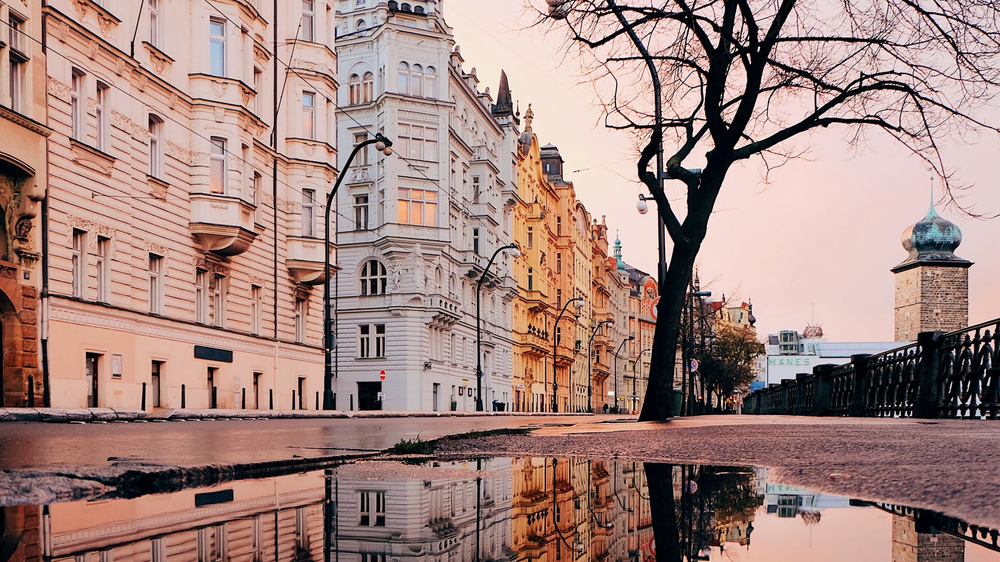

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow

# Дефолтное изображение
img1 = cv.imread('/content/arhitektura_luzha_otrazhenie_123779_1920x1080.jpeg', cv.IMREAD_UNCHANGED)
# Тренировочное изображение
img2 = cv.imread('/content/arhitektura_luzha_otrazhenie_123779_1920x1080 2.jpeg', cv.IMREAD_UNCHANGED)  

cv2_imshow(img1)

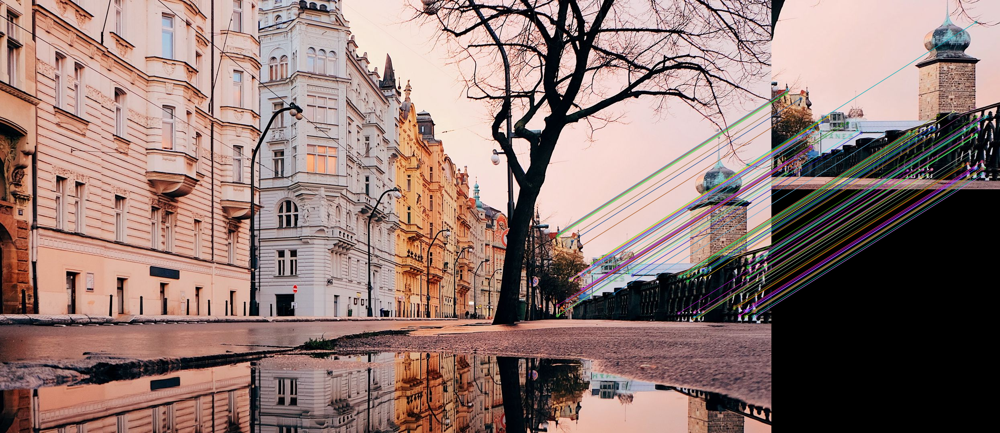

In [ ]:
# Создание ORB конструктора с максимальным числом точек = 10000
orb = cv.ORB_create(10000)

# Нахождение особых точек
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Создание обьекта для сопоставления изображений
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)

# Сопоставление дескрипторов
matches = bf.match(des1, des2)

# Сортировка по удаленности
matches = sorted(matches, key=lambda x: x.distance)

# Вывод сопоставлений с пределом 100 точек
img3 = cv.drawMatches(img1, kp1, img2, kp2, matches[:100], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(img3)